# 🦾 Inverse Kinematics Planar Robot 3-DOF — TUGAS PRAKTIKUM
## Perubahan Link [0.5, 0.4, 0.3]
---
> **Nama:** [SISTRA AMANDA SINAGA]  
> **NIM:** [42223O1O11]  
> **Tanggal:** Praktikum IK Robot 3-DOF


---
## 📝 Bagian 0: Jawaban Pertanyaan Diskusi

### 1. Mengapa DL lebih akurat dari KNN meskipun datanya sama?

**KNN (K-Nearest Neighbors):**
- KNN bekerja dengan mencari K tetangga terdekat di training data, lalu merata-rata sudut joint-nya.
- Karena IK bersifat **non-linear** dan memiliki banyak solusi (ambiguitas), rata-rata dari beberapa konfigurasi yang berbeda bisa menghasilkan prediksi yang tidak valid secara fisik.
- KNN tidak mempelajari representasi internal — ia hanya *interpolasi lokal* tanpa memahami hubungan global antara posisi dan sudut.

**Deep Learning (MLP):**
- MLP dengan banyak layer mampu mempelajari **representasi non-linear** yang kompleks dari data yang sama.
- Loss dihitung di **ruang end-effector (kartesian)**, bukan di ruang sudut — sehingga model dioptimalkan langsung terhadap error fisik yang kita pedulikan.
- Dengan Batch Normalization, Dropout, dan CosineAnnealingLR, DL mampu **generalisasi lebih baik** ke titik yang belum pernah dilihat.
- **Singkatnya:** DL *belajar fungsi*, KNN *mengingat data*. Untuk fungsi yang kompleks seperti IK, belajar fungsi jauh lebih efektif.

---
### 2. Mengapa RL tidak butuh dataset tetapi training-nya lebih lama?

**Kenapa tidak butuh dataset?**
- RL belajar melalui **trial-and-error** dengan berinteraksi langsung dengan environment.
- Agent hanya menerima *reward signal* (seberapa dekat end-effector ke target) — tidak ada contoh input-output yang harus disiapkan sebelumnya.
- Data "dibuat sendiri" secara online selama training (self-supervised dari interaksi).

**Kenapa training-nya lebih lama?**
- **Reward sparse & delayed:** Agent sering mendapat reward negatif jauh sebelum menemukan solusi yang baik. Dibutuhkan jutaan step agar policy konvergen.
- **Eksplorasi vs eksploitasi:** Agent harus mengeksplorasi ruang aksi yang besar (kombinasi delta sudut joint) sebelum menemukan strategi yang efektif.
- **Bootstrapping:** PPO harus men-estimasi *value function* dan *policy* secara bersamaan, yang membutuhkan banyak iterasi.
- **Singkatnya:** Supervised learning langsung belajar dari "guru" (data), RL belajar dari "pengalaman sendiri" — seperti belajar bersepeda, butuh banyak percobaan sebelum bisa.

---
### 3. Bagaimana menambahkan obstacle avoidance pada pendekatan RL?

**a. Augmentasi Observation Space:**
Tambahkan posisi obstacle ke dalam state:
```python
obs = [theta1, theta2, theta3, dtheta, target_x, target_y, obs_x, obs_y, obs_radius]
```

**b. Reward Shaping dengan Penalti Collision:**
```python
def check_collision(theta, obstacle_center, obstacle_radius):
    p0, p1, p2, p3 = forward_kinematics(theta)
    for p in [p1, p2, p3]:
        if np.linalg.norm(p - obstacle_center) < obstacle_radius:
            return True
    return False

# Di dalam step():
if check_collision(self.theta, obstacle, obs_r):
    reward -= 5.0   # penalti besar
    terminated = True
```

**c. Curriculum Learning:** Mulai tanpa obstacle → tambahkan obstacle kecil → perbesar bertahap.

**d. Algoritma RL yang lebih canggih:** SAC (Soft Actor-Critic) lebih sample-efficient untuk lingkungan dengan obstacle dinamis.

---
### 4. Apa kelemahan supervised learning (ML/DL) untuk IK pada konfigurasi baru?

1. **Tidak bisa generalisasi ke konfigurasi robot baru:** Jika panjang link berubah (misal dari [0.4, 0.3, 0.2] ke [0.5, 0.4, 0.3]), model harus **di-retrain dari nol** dengan dataset baru.

2. **Dataset harus mencakup seluruh workspace:** Jika ada titik di workspace yang undersampled, akurasi di area tersebut akan buruk.

3. **Ambiguitas solusi IK:** Satu posisi end-effector bisa punya **banyak konfigurasi sudut**. Model supervised learning cenderung belajar rata-rata dari semua solusi → hasil yang tidak konsisten.

4. **Tidak adaptif terhadap perubahan lingkungan:** Jika ada obstacle atau constraint tambahan, model harus dilatih ulang. RL secara alami lebih adaptif.

5. **Extrapolation buruk:** Jika target berada di area yang jarang ada di training set, prediksi bisa sangat buruk. KNN khususnya sangat buruk di area sparse.


---
## 🛠️ Bagian 1: Setup & Konfigurasi Robot BARU [0.5, 0.4, 0.3]

In [17]:
# Install dependencies
!pip install gymnasium stable-baselines3 scikit-learn torch matplotlib numpy tqdm -q

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.patches import Circle
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')
import time

print("✅ Library siap!")


✅ Library siap!


In [18]:
# ─── Konfigurasi Robot BARU ────────────────────────────────────────────
# TUGAS: Ubah link dari [0.4, 0.3, 0.2] → [0.5, 0.4, 0.3]
L1_OLD, L2_OLD, L3_OLD = 0.4, 0.3, 0.2   # konfigurasi lama
L1, L2, L3             = 0.5, 0.4, 0.3   # konfigurasi BARU ✅

LINK_LENGTHS = np.array([L1, L2, L3])
JOINT_LIMIT  = np.pi
MAX_REACH    = L1 + L2 + L3

print(f"🔄 Konfigurasi Link:")
print(f"   Lama : L1={L1_OLD}, L2={L2_OLD}, L3={L3_OLD} → MAX_REACH = {L1_OLD+L2_OLD+L3_OLD:.1f} m")
print(f"   BARU : L1={L1},     L2={L2},     L3={L3}     → MAX_REACH = {MAX_REACH:.1f} m")
print(f"   📏 Peningkatan jangkauan: +{MAX_REACH - (L1_OLD+L2_OLD+L3_OLD):.2f} m ({(MAX_REACH/(L1_OLD+L2_OLD+L3_OLD)-1)*100:.1f}%)")

def forward_kinematics(theta):
    t1, t2, t3 = theta
    p0 = np.array([0.0, 0.0])
    p1 = p0 + L1 * np.array([np.cos(t1), np.sin(t1)])
    p2 = p1 + L2 * np.array([np.cos(t1+t2), np.sin(t1+t2)])
    p3 = p2 + L3 * np.array([np.cos(t1+t2+t3), np.sin(t1+t2+t3)])
    return p0, p1, p2, p3

def get_end_effector(theta):
    return forward_kinematics(theta)[3]

def is_reachable(target, tol=1e-6):
    target = np.array(target, dtype=float)
    dist   = np.linalg.norm(target)
    return bool(dist <= MAX_REACH + tol)

def filter_reachable(positions, labels=None):
    mask = np.array([is_reachable(p) for p in positions])
    if labels is not None:
        return positions[mask], labels[mask], mask
    return positions[mask], mask

def plot_robot(ax, theta, target=None, title="Robot", color='steelblue'):
    p0, p1, p2, p3 = forward_kinematics(theta)
    points = np.array([p0, p1, p2, p3])
    ax.plot(points[:,0], points[:,1], '-o', color=color,
            linewidth=3, markersize=8, markerfacecolor='white',
            markeredgecolor=color, markeredgewidth=2)
    ax.plot(*p0, 'ks', markersize=10)
    ax.plot(*p3, '*', color='red', markersize=14, label='End-effector')
    if target is not None:
        ax.plot(*target, 'r+', markersize=16, markeredgewidth=3, label='Target')
        ax.add_patch(Circle(target, 0.02, color='red', alpha=0.3))
    lim = MAX_REACH + 0.2
    ax.set_xlim(-lim, lim); ax.set_ylim(-lim, lim)
    ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
    ax.set_title(title, fontsize=11, fontweight='bold')
    ax.axhline(0, color='k', lw=0.5, alpha=0.3)
    ax.axvline(0, color='k', lw=0.5, alpha=0.3)

print("✅ Fungsi robot siap!")


🔄 Konfigurasi Link:
   Lama : L1=0.4, L2=0.3, L3=0.2 → MAX_REACH = 0.9 m
   BARU : L1=0.5,     L2=0.4,     L3=0.3     → MAX_REACH = 1.2 m
   📏 Peningkatan jangkauan: +0.30 m (33.3%)
✅ Fungsi robot siap!


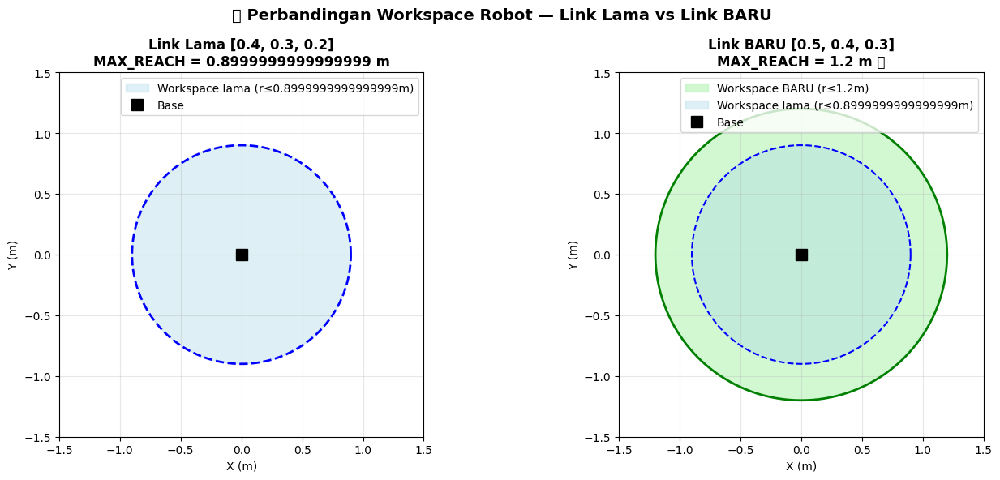

📊 Perbandingan Workspace:
   Luas lama : π × 0.8999999999999999² = 2.5447 m²
   Luas BARU : π × 1.2² = 4.5239 m²
   Peningkatan: +77.8%


In [19]:
# ─── Visualisasi Perbandingan Workspace Lama vs Baru ─────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
MAX_OLD = L1_OLD + L2_OLD + L3_OLD
theta_range = np.linspace(0, 2*np.pi, 300)

# Workspace LAMA
ax = axes[0]
ax.fill(MAX_OLD * np.cos(theta_range), MAX_OLD * np.sin(theta_range),
        color='lightblue', alpha=0.4, label=f'Workspace lama (r≤{MAX_OLD}m)')
ax.plot(MAX_OLD * np.cos(theta_range), MAX_OLD * np.sin(theta_range), 'b--', linewidth=2)
ax.plot(0, 0, 'ks', markersize=10, label='Base')
ax.set_xlim(-1.5, 1.5); ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_title(f"Link Lama [0.4, 0.3, 0.2]\nMAX_REACH = {MAX_OLD} m", fontsize=12, fontweight='bold')
ax.set_xlabel("X (m)"); ax.set_ylabel("Y (m)"); ax.legend()

# Workspace BARU
ax = axes[1]
ax.fill(MAX_REACH * np.cos(theta_range), MAX_REACH * np.sin(theta_range),
        color='lightgreen', alpha=0.4, label=f'Workspace BARU (r≤{MAX_REACH}m)')
ax.plot(MAX_REACH * np.cos(theta_range), MAX_REACH * np.sin(theta_range), 'g-', linewidth=2)
ax.fill(MAX_OLD * np.cos(theta_range), MAX_OLD * np.sin(theta_range),
        color='lightblue', alpha=0.4, label=f'Workspace lama (r≤{MAX_OLD}m)')
ax.plot(MAX_OLD * np.cos(theta_range), MAX_OLD * np.sin(theta_range), 'b--', linewidth=1.5)
ax.plot(0, 0, 'ks', markersize=10, label='Base')
ax.set_xlim(-1.5, 1.5); ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3)
ax.set_title(f"Link BARU [0.5, 0.4, 0.3]\nMAX_REACH = {MAX_REACH} m ✅", fontsize=12, fontweight='bold')
ax.set_xlabel("X (m)"); ax.set_ylabel("Y (m)"); ax.legend()

plt.suptitle("📏 Perbandingan Workspace Robot — Link Lama vs Link BARU", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

luas_lama = np.pi * MAX_OLD**2
luas_baru = np.pi * MAX_REACH**2
print(f"📊 Perbandingan Workspace:")
print(f"   Luas lama : π × {MAX_OLD}² = {luas_lama:.4f} m²")
print(f"   Luas BARU : π × {MAX_REACH}² = {luas_baru:.4f} m²")
print(f"   Peningkatan: +{(luas_baru/luas_lama - 1)*100:.1f}%")


---
## 📊 Bagian 2: Generate Dataset dengan Link Baru

✅ Dataset dengan link [0.5, 0.4, 0.3]: 18000 sampel
   MAX_REACH baru: 1.2 m
   EE range X: [-1.20, 1.20]
   EE range Y: [-1.20, 1.19]


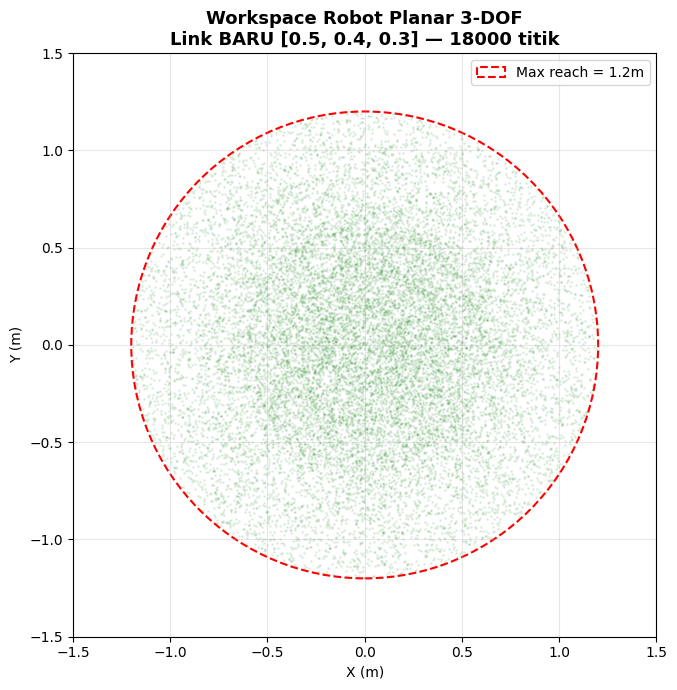

In [20]:
# ─── Generate Dataset ────────────────────────────────────────────────
np.random.seed(42)
N = 18000

thetas       = np.random.uniform(-JOINT_LIMIT, JOINT_LIMIT, size=(N, 3)).astype(np.float32)
ee_positions = np.array([get_end_effector(t) for t in thetas], dtype=np.float32)

_, reach_mask = filter_reachable(ee_positions)
ee_positions  = ee_positions[reach_mask]
thetas        = thetas[reach_mask]

print(f"✅ Dataset dengan link [0.5, 0.4, 0.3]: {len(ee_positions)} sampel")
print(f"   MAX_REACH baru: {MAX_REACH} m")
print(f"   EE range X: [{ee_positions[:,0].min():.2f}, {ee_positions[:,0].max():.2f}]")
print(f"   EE range Y: [{ee_positions[:,1].min():.2f}, {ee_positions[:,1].max():.2f}]")

fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(ee_positions[:,0], ee_positions[:,1], alpha=0.1, s=1, color='forestgreen')
circle = plt.Circle((0,0), MAX_REACH, fill=False, color='red',
                     linestyle='--', linewidth=1.5, label=f'Max reach = {MAX_REACH}m')
ax.add_patch(circle)
ax.set_title(f"Workspace Robot Planar 3-DOF\nLink BARU [0.5, 0.4, 0.3] — {len(ee_positions)} titik",
             fontsize=13, fontweight='bold')
ax.set_xlabel("X (m)"); ax.set_ylabel("Y (m)")
ax.set_xlim(-1.5, 1.5); ax.set_ylim(-1.5, 1.5)
ax.set_aspect('equal'); ax.grid(True, alpha=0.3); ax.legend()
plt.tight_layout(); plt.show()


In [21]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(
    ee_positions, thetas, test_size=0.2, random_state=42)
print(f"Train: {X_train.shape[0]} sampel | Test: {X_test.shape[0]} sampel")


Train: 14400 sampel | Test: 3600 sampel


---
## 🤖 Bagian 3: Machine Learning — Optimasi (KNN + RF + SVR)

**Optimasi yang dilakukan:**
- **KNN:** `n_neighbors=7`, tambah `weights='distance'` (tetangga lebih dekat = bobot lebih besar)
- **Random Forest:** `n_estimators=200`, `max_depth=20`, `min_samples_leaf=2`
- **SVR (Metode Tambahan):** Kernel RBF dengan `C=10, gamma='scale'` — mampu memodelkan hubungan non-linear kompleks


In [22]:
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
from sklearn.preprocessing import StandardScaler

scaler_X  = StandardScaler()
X_train_s = scaler_X.fit_transform(X_train)
X_test_s  = scaler_X.transform(X_test)

ml_results = {}

# ─── 1. KNN Optimized ─────────────────────────────────────────────────
print("🔵 Training KNN (k=7, weights=distance)...")
t0  = time.time()
knn = KNeighborsRegressor(n_neighbors=7, weights='distance', n_jobs=-1)
knn.fit(X_train_s, y_train)
knn_pred = knn.predict(X_test_s)
t_knn    = time.time() - t0
knn_ee   = np.array([get_end_effector(p) for p in knn_pred])
knn_err  = np.linalg.norm(knn_ee - X_test, axis=1)
ml_results['KNN (k=7, dist)'] = {'pred': knn_pred, 'ee_err': knn_err, 'time': t_knn}
print(f"   ✅ mean EE error: {knn_err.mean()*100:.2f} cm | time: {t_knn:.1f}s")

# ─── 2. Random Forest Optimized ───────────────────────────────────────
print("\n🌲 Training Random Forest (200 trees, depth=20)...")
t0 = time.time()
rf = RandomForestRegressor(n_estimators=200, max_depth=20, min_samples_leaf=2,
                           n_jobs=-1, random_state=42)
rf.fit(X_train_s, y_train)
rf_pred  = rf.predict(X_test_s)
t_rf     = time.time() - t0
rf_ee    = np.array([get_end_effector(p) for p in rf_pred])
rf_err   = np.linalg.norm(rf_ee - X_test, axis=1)
ml_results['Random Forest (200t)'] = {'pred': rf_pred, 'ee_err': rf_err, 'time': t_rf}
print(f"   ✅ mean EE error: {rf_err.mean()*100:.2f} cm | time: {t_rf:.1f}s")

# ─── 3. SVR — Metode Tambahan (Optimasi) ─────────────────────────────
print("\n⚡ Training SVR (RBF kernel, C=10) — Metode Tambahan...")
t0  = time.time()
svr = MultiOutputRegressor(SVR(kernel='rbf', C=10, gamma='scale', epsilon=0.01), n_jobs=-1)
svr.fit(X_train_s, y_train)
svr_pred = svr.predict(X_test_s)
t_svr    = time.time() - t0
svr_ee   = np.array([get_end_effector(p) for p in svr_pred])
svr_err  = np.linalg.norm(svr_ee - X_test, axis=1)
ml_results['SVR (RBF, C=10)'] = {'pred': svr_pred, 'ee_err': svr_err, 'time': t_svr}
print(f"   ✅ mean EE error: {svr_err.mean()*100:.2f} cm | time: {t_svr:.1f}s")

print("\n📊 Ringkasan ML dengan Link [0.5, 0.4, 0.3]:")
for name, res in ml_results.items():
    print(f"   {name:25s} | Error: {res['ee_err'].mean()*100:.2f} cm | Time: {res['time']:.1f}s")


🔵 Training KNN (k=7, weights=distance)...
   ✅ mean EE error: 64.29 cm | time: 0.0s

🌲 Training Random Forest (200 trees, depth=20)...
   ✅ mean EE error: 71.52 cm | time: 11.2s

⚡ Training SVR (RBF kernel, C=10) — Metode Tambahan...
   ✅ mean EE error: 63.27 cm | time: 36.6s

📊 Ringkasan ML dengan Link [0.5, 0.4, 0.3]:
   KNN (k=7, dist)           | Error: 64.29 cm | Time: 0.0s
   Random Forest (200t)      | Error: 71.52 cm | Time: 11.2s
   SVR (RBF, C=10)           | Error: 63.27 cm | Time: 36.6s


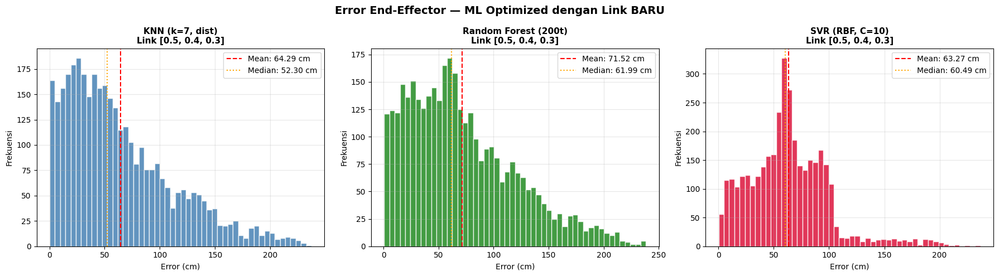

In [23]:
# ─── Visualisasi Error Distribusi ML ─────────────────────────────────
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
colors_ml = ['steelblue', 'forestgreen', 'crimson']
for ax, (name, res), c in zip(axes, ml_results.items(), colors_ml):
    ax.hist(res['ee_err']*100, bins=50, color=c, edgecolor='white', alpha=0.85)
    ax.axvline(res['ee_err'].mean()*100, color='red', linestyle='--',
               label=f"Mean: {res['ee_err'].mean()*100:.2f} cm")
    ax.axvline(np.median(res['ee_err']*100), color='orange', linestyle=':',
               label=f"Median: {np.median(res['ee_err']*100):.2f} cm")
    ax.set_title(f"{name}\nLink [0.5, 0.4, 0.3]", fontsize=11, fontweight='bold')
    ax.set_xlabel("Error (cm)"); ax.set_ylabel("Frekuensi")
    ax.legend(); ax.grid(True, alpha=0.3)
plt.suptitle("Error End-Effector — ML Optimized dengan Link BARU", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()


In [24]:
# ─── Animasi ML ──────────────────────────────────────────────────────
def animate_ik(model_name, predict_fn, n_targets=10, color='steelblue'):
    np.random.seed(7)
    sample_idx = np.random.choice(len(X_test), n_targets, replace=False)
    targets = X_test[sample_idx]
    fig, ax = plt.subplots(figsize=(6, 6))
    def update(frame):
        ax.clear()
        target     = targets[frame]
        theta_pred = predict_fn(target.reshape(1,-1))[0]
        ee_actual  = get_end_effector(theta_pred)
        err        = np.linalg.norm(ee_actual - target) * 100
        plot_robot(ax, theta_pred, target=target,
                   title=f"{model_name}\nTarget ({target[0]:.2f},{target[1]:.2f}) | Err: {err:.1f} cm",
                   color=color)
        ax.legend(loc='upper right', fontsize=8)
    ani = animation.FuncAnimation(fig, update, frames=n_targets, interval=800, repeat=True)
    plt.close()
    return ani

ani_knn = animate_ik("KNN (k=7, distance weight)",
                     lambda x: knn.predict(scaler_X.transform(x)), color='steelblue')
print("▶️  Animasi KNN Optimized:")
HTML(ani_knn.to_jshtml())


▶️  Animasi KNN Optimized:


In [25]:
ani_rf = animate_ik("Random Forest (200 trees, depth=20)",
                    lambda x: rf.predict(scaler_X.transform(x)), color='forestgreen')
print("▶️  Animasi Random Forest Optimized:")
HTML(ani_rf.to_jshtml())


▶️  Animasi Random Forest Optimized:


In [26]:
ani_svr = animate_ik("SVR (RBF Kernel, C=10) — Metode Tambahan",
                     lambda x: svr.predict(scaler_X.transform(x)), color='crimson')
print("▶️  Animasi SVR (Metode Baru):")
HTML(ani_svr.to_jshtml())


▶️  Animasi SVR (Metode Baru):


---
## 🧠 Bagian 4: Deep Learning (PyTorch MLP) — Link Baru [0.5, 0.4, 0.3]

In [27]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🖥️  Device: {device}")

class IKNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(2, 256), nn.BatchNorm1d(256), nn.ReLU(),
            nn.Linear(256, 512), nn.BatchNorm1d(512), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(512, 512), nn.BatchNorm1d(512), nn.ReLU(),
            nn.Dropout(0.1),
            nn.Linear(512, 256), nn.BatchNorm1d(256), nn.ReLU(),
            nn.Linear(256, 3),
        )
    def forward(self, x):
        return torch.tanh(self.net(x)) * torch.pi

model_dl = IKNet().to(device)
print(f"✅ Model: {sum(p.numel() for p in model_dl.parameters()):,} parameter")


🖥️  Device: cpu
✅ Model: 530,179 parameter


In [28]:
def fk_torch(theta):
    t1, t2, t3 = theta[:,0], theta[:,1], theta[:,2]
    x = L1*torch.cos(t1) + L2*torch.cos(t1+t2) + L3*torch.cos(t1+t2+t3)
    y = L1*torch.sin(t1) + L2*torch.sin(t1+t2) + L3*torch.sin(t1+t2+t3)
    return torch.stack([x, y], dim=1)

X_tr_t = torch.FloatTensor(X_train).to(device)
X_te_t = torch.FloatTensor(X_test).to(device)
y_tr_t = torch.FloatTensor(y_train).to(device)

train_ds     = TensorDataset(X_tr_t, y_tr_t)
train_loader = DataLoader(train_ds, batch_size=512, shuffle=True)

optimizer = optim.Adam(model_dl.parameters(), lr=1e-3, weight_decay=1e-5)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=100)
EPOCHS    = 100
train_losses, val_losses = [], []

print("🚀 Training DL dengan Link BARU [0.5, 0.4, 0.3]...")
for epoch in range(EPOCHS):
    model_dl.train()
    ep_loss = 0
    for xb, yb in train_loader:
        optimizer.zero_grad()
        pred_theta = model_dl(xb)
        pred_ee    = fk_torch(pred_theta)
        loss       = nn.MSELoss()(pred_ee, xb)
        loss.backward(); optimizer.step()
        ep_loss += loss.item()
    train_losses.append(ep_loss / len(train_loader))
    model_dl.eval()
    with torch.no_grad():
        val_loss = nn.MSELoss()(fk_torch(model_dl(X_te_t)), X_te_t).item()
    val_losses.append(val_loss)
    scheduler.step()
    if (epoch+1) % 20 == 0:
        print(f"   Epoch {epoch+1:3d}/{EPOCHS} | Train: {train_losses[-1]:.6f} | Val: {val_loss:.6f}")

print("✅ Training DL selesai!")


🚀 Training DL dengan Link BARU [0.5, 0.4, 0.3]...
   Epoch  20/100 | Train: 0.011388 | Val: 0.007737
   Epoch  40/100 | Train: 0.005828 | Val: 0.003591
   Epoch  60/100 | Train: 0.005691 | Val: 0.005106
   Epoch  80/100 | Train: 0.002977 | Val: 0.002443
   Epoch 100/100 | Train: 0.002392 | Val: 0.001589
✅ Training DL selesai!


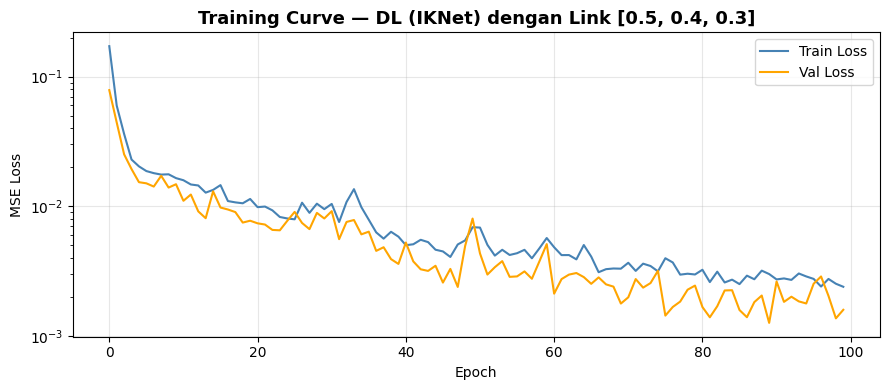

✅ DL — mean EE error: 2.06 cm | Link [0.5, 0.4, 0.3]


In [29]:
fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(train_losses, label='Train Loss', color='steelblue')
ax.plot(val_losses,   label='Val Loss',   color='orange')
ax.set_title("Training Curve — DL (IKNet) dengan Link [0.5, 0.4, 0.3]", fontsize=13, fontweight='bold')
ax.set_xlabel("Epoch"); ax.set_ylabel("MSE Loss"); ax.legend(); ax.grid(True, alpha=0.3)
ax.set_yscale('log'); plt.tight_layout(); plt.show()

model_dl.eval()
with torch.no_grad():
    dl_pred = model_dl(X_te_t).cpu().numpy()
dl_ee  = np.array([get_end_effector(p) for p in dl_pred])
dl_err = np.linalg.norm(dl_ee - X_test, axis=1)
print(f"✅ DL — mean EE error: {dl_err.mean()*100:.2f} cm | Link [0.5, 0.4, 0.3]")


In [30]:
def dl_predict(xy):
    model_dl.eval()
    with torch.no_grad():
        t = torch.FloatTensor(xy).to(device)
        return model_dl(t).cpu().numpy()

ani_dl = animate_ik("Deep Learning (MLP PyTorch) — Link Baru", dl_predict, color='darkorange')
print("▶️  Animasi Deep Learning (Link BARU):")
HTML(ani_dl.to_jshtml())


▶️  Animasi Deep Learning (Link BARU):


---
## 🕹️ Bagian 5: Reinforcement Learning (PPO) — Link Baru [0.5, 0.4, 0.3]

In [31]:
import gymnasium as gym
from gymnasium import spaces

JOINT_LIMITS_LOW  = np.array([-np.pi, -2*np.pi/3, -np.pi/2], dtype=np.float32)
JOINT_LIMITS_HIGH = np.array([ np.pi,  2*np.pi/3,  np.pi/2], dtype=np.float32)

class PlanarRobot3DOFEnv(gym.Env):
    metadata = {"render_modes": ["rgb_array"], "render_fps": 30}
    def __init__(self, render_mode=None):
        super().__init__()
        self.render_mode = render_mode
        self.max_steps   = 200
        self.goal_thresh = 0.02
        obs_high = np.concatenate([JOINT_LIMITS_HIGH,
                                   np.array([5.0,5.0,5.0], dtype=np.float32),
                                   np.array([MAX_REACH, MAX_REACH], dtype=np.float32)])
        self.observation_space = spaces.Box(-obs_high, obs_high, dtype=np.float32)
        act_high = np.array([0.15, 0.10, 0.08], dtype=np.float32)
        self.action_space = spaces.Box(-act_high, act_high, dtype=np.float32)
        self._reset_state()

    def _reset_state(self):
        self.theta  = np.random.uniform(JOINT_LIMITS_LOW*0.3, JOINT_LIMITS_HIGH*0.3).astype(np.float32)
        self.dtheta = np.zeros(3, dtype=np.float32)
        self.steps  = 0
        while True:
            target_angles = np.random.uniform(-np.pi, np.pi, 3).astype(np.float32)
            self.target   = get_end_effector(target_angles).astype(np.float32)
            if is_reachable(self.target):
                break

    def _get_obs(self):
        return np.concatenate([self.theta, self.dtheta, self.target]).astype(np.float32)

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        if seed is not None: np.random.seed(seed)
        self._reset_state()
        return self._get_obs(), {}

    def step(self, action):
        act_high = np.array([0.15, 0.10, 0.08], dtype=np.float32)
        delta       = np.clip(action, -act_high, act_high).astype(np.float32)
        self.theta  = np.clip(self.theta + delta, JOINT_LIMITS_LOW, JOINT_LIMITS_HIGH).astype(np.float32)
        self.dtheta = delta
        ee   = get_end_effector(self.theta)
        dist = float(np.linalg.norm(ee - self.target))
        reward = -dist - 0.005 * float(np.sum(self.theta[1:]**2))
        terminated = False
        if dist < self.goal_thresh:
            reward += 10.0; terminated = True
        self.steps += 1
        truncated = self.steps >= self.max_steps
        return self._get_obs(), reward, terminated, truncated, {"dist": dist}

from gymnasium.utils.env_checker import check_env
check_env(PlanarRobot3DOFEnv(), warn=True)
print("✅ Environment RL siap! (Link BARU [0.5, 0.4, 0.3])")


✅ Environment RL siap! (Link BARU [0.5, 0.4, 0.3])


In [16]:
from stable_baselines3 import PPO
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.callbacks import EvalCallback, BaseCallback

class RewardLoggerCallback(BaseCallback):
    def __init__(self, log_freq=5000, verbose=0):
        super().__init__(verbose)
        self.log_freq = log_freq
        self.timesteps_log = []; self.mean_rewards = []; self.mean_ep_lens = []
        self._ep_rewards = []; self._ep_lens = []
        self._cur_ep_reward = None; self._cur_ep_len = None

    def _on_training_start(self):
        self._cur_ep_reward = np.zeros(self.training_env.num_envs)
        self._cur_ep_len    = np.zeros(self.training_env.num_envs, dtype=int)

    def _on_step(self):
        rewards = self.locals["rewards"]; dones = self.locals["dones"]
        self._cur_ep_reward += rewards; self._cur_ep_len += 1
        for idx, done in enumerate(dones):
            if done:
                self._ep_rewards.append(self._cur_ep_reward[idx])
                self._ep_lens.append(self._cur_ep_len[idx])
                self._cur_ep_reward[idx] = 0; self._cur_ep_len[idx] = 0
        if self.n_calls % self.log_freq == 0 and len(self._ep_rewards) > 0:
            mean_r   = float(np.mean(self._ep_rewards[-50:]))
            mean_len = float(np.mean(self._ep_lens[-50:]))
            self.timesteps_log.append(self.num_timesteps)
            self.mean_rewards.append(mean_r)
            self.mean_ep_lens.append(mean_len)
            print(f"   ⏱  {self.num_timesteps:>8,} steps | mean_reward: {mean_r:7.3f} | ep_len: {mean_len:.1f}")
        return True

vec_env  = make_vec_env(PlanarRobot3DOFEnv, n_envs=16)
eval_env = make_vec_env(PlanarRobot3DOFEnv, n_envs=1)
model_rl = PPO("MlpPolicy", vec_env, learning_rate=3e-4,
               n_steps=1024, batch_size=256, n_epochs=10,
               gamma=0.99, gae_lambda=0.95, clip_range=0.2, ent_coef=0.01,
               policy_kwargs=dict(net_arch=dict(pi=[256,256], vf=[256,256])), verbose=0)
eval_cb       = EvalCallback(eval_env, eval_freq=20000, n_eval_episodes=10,
                              best_model_save_path="./rl_best/", verbose=0)
reward_logger = RewardLoggerCallback(log_freq=5000)
print("🚀 Training PPO (800k timesteps) — Link BARU [0.5, 0.4, 0.3]...")
model_rl.learn(total_timesteps=800_000, callback=[eval_cb, reward_logger])
print("✅ Training RL selesai!")


Gym has been unmaintained since 2022 and does not support NumPy 2.0 amongst other critical functionality.
Please upgrade to Gymnasium, the maintained drop-in replacement of Gym, or contact the authors of your software and request that they upgrade.
See the migration guide at https://gymnasium.farama.org/introduction/migration_guide/ for additional information.


🚀 Training PPO (800k timesteps) — Link BARU [0.5, 0.4, 0.3]...


/usr/local/lib/python3.12/dist-packages/jupyter_client/session.py:203: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  return datetime.utcnow().replace(tzinfo=utc)


   ⏱    80,000 steps | mean_reward: -171.203 | ep_len: 195.2
   ⏱   160,000 steps | mean_reward: -119.061 | ep_len: 191.0
   ⏱   240,000 steps | mean_reward: -88.665 | ep_len: 179.4
   ⏱   320,000 steps | mean_reward: -65.383 | ep_len: 154.4
   ⏱   400,000 steps | mean_reward: -61.163 | ep_len: 159.5
   ⏱   480,000 steps | mean_reward: -48.694 | ep_len: 148.1
   ⏱   560,000 steps | mean_reward: -46.194 | ep_len: 143.9
   ⏱   640,000 steps | mean_reward: -43.647 | ep_len: 150.3
   ⏱   720,000 steps | mean_reward: -30.324 | ep_len: 114.1
   ⏱   800,000 steps | mean_reward: -28.003 | ep_len: 111.2
✅ Training RL selesai!


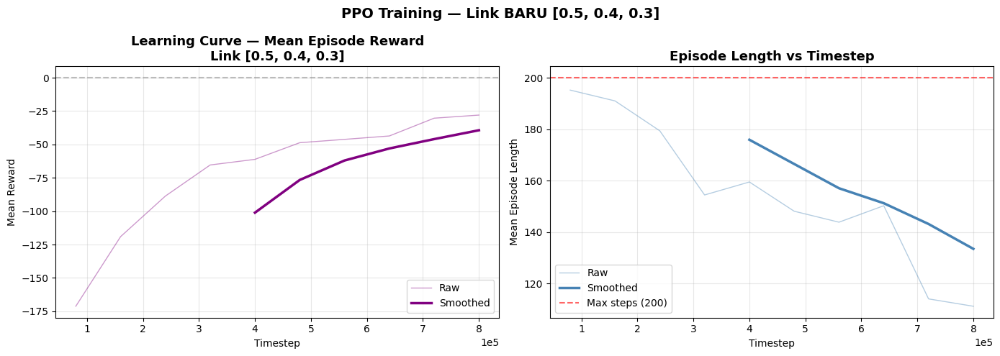

Reward awal   : -70.234
Reward akhir  : -70.234
Peningkatan   : +0.000


In [32]:
# ─── Learning Curve ───────────────────────────────────────────────────
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
ts  = np.array(reward_logger.timesteps_log)
rew = np.array(reward_logger.mean_rewards)

ax = axes[0]
ax.plot(ts, rew, color='purple', alpha=0.4, linewidth=1, label='Raw')
if len(rew) >= 10:
    window = max(5, len(rew) // 10)
    smooth = np.convolve(rew, np.ones(window)/window, mode='valid')
    ts_smooth = ts[window-1:]
    ax.plot(ts_smooth, smooth, color='purple', linewidth=2.5, label='Smoothed')
ax.axhline(0, color='gray', linestyle='--', alpha=0.5)
ax.set_title("Learning Curve — Mean Episode Reward\nLink [0.5, 0.4, 0.3]", fontsize=13, fontweight='bold')
ax.set_xlabel("Timestep"); ax.set_ylabel("Mean Reward"); ax.legend(); ax.grid(True, alpha=0.3)
ax.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

ax2 = axes[1]
ep_len = np.array(reward_logger.mean_ep_lens)
ax2.plot(ts, ep_len, color='steelblue', alpha=0.4, linewidth=1, label='Raw')
if len(ep_len) >= 10:
    smooth_len = np.convolve(ep_len, np.ones(window)/window, mode='valid')
    ax2.plot(ts_smooth, smooth_len, color='steelblue', linewidth=2.5, label='Smoothed')
ax2.axhline(200, color='red', linestyle='--', alpha=0.6, label='Max steps (200)')
ax2.set_title("Episode Length vs Timestep", fontsize=13, fontweight='bold')
ax2.set_xlabel("Timestep"); ax2.set_ylabel("Mean Episode Length"); ax2.legend(); ax2.grid(True, alpha=0.3)
ax2.ticklabel_format(axis='x', style='sci', scilimits=(0,0))

plt.suptitle("PPO Training — Link BARU [0.5, 0.4, 0.3]", fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

if len(rew) > 0:
    print(f"Reward awal   : {np.mean(rew[:10]):.3f}")
    print(f"Reward akhir  : {np.mean(rew[-10:]):.3f}")
    print(f"Peningkatan   : {np.mean(rew[-10:]) - np.mean(rew[:10]):+.3f}")


In [33]:
# ─── Evaluasi RL ──────────────────────────────────────────────────────
eval_single = PlanarRobot3DOFEnv()
successes, distances = [], []
model_rl.load('./rl_best/best_model.zip')
np.random.seed(99)
for _ in range(200):
    obs, _ = eval_single.reset()
    for _ in range(200):
        action, _ = model_rl.predict(obs, deterministic=True)
        obs, reward, terminated, truncated, info = eval_single.step(action)
        if terminated or truncated: break
    distances.append(info['dist']); successes.append(info['dist'] < 0.02)

print(f"✅ RL Success rate  : {np.mean(successes)*100:.1f}%")
print(f"✅ RL Mean EE error : {np.mean(distances)*100:.2f} cm")
rl_errors = np.array(distances)


✅ RL Success rate  : 24.0%
✅ RL Mean EE error : 11.39 cm


In [34]:
def animate_rl(n_episodes=8):
    trajectories = []
    env_anim = PlanarRobot3DOFEnv()
    np.random.seed(55)
    for ep in range(n_episodes):
        obs, _ = env_anim.reset(seed=ep*10)
        target = env_anim.target.copy(); traj = []
        for _ in range(80):
            action, _ = model_rl.predict(obs, deterministic=True)
            obs, _, terminated, truncated, info = env_anim.step(action)
            traj.append((env_anim.theta.copy(), target.copy(), info['dist']))
            if terminated or truncated: break
        trajectories.append(traj)
    all_frames = []
    for traj in trajectories:
        all_frames.extend(traj[::3]); all_frames.extend([traj[-1]] * 5)
    fig, ax = plt.subplots(figsize=(6, 6))
    def update(i):
        ax.clear()
        theta, target, dist = all_frames[i]
        success = dist < 0.02
        plot_robot(ax, theta, target=target,
                   title=f"RL Agent (PPO) — Link [0.5,0.4,0.3]\n{'✅ BERHASIL!' if success else f'dist: {dist*100:.1f} cm'}",
                   color='green' if success else 'purple')
        ax.legend(loc='upper right', fontsize=8)
    ani = animation.FuncAnimation(fig, update, frames=len(all_frames), interval=120, repeat=True)
    plt.close()
    return ani

ani_rl = animate_rl()
print("▶️  Animasi Reinforcement Learning (Link BARU):")
HTML(ani_rl.to_jshtml())


▶️  Animasi Reinforcement Learning (Link BARU):


---
## 📊 Bagian 6: Perbandingan Semua Metode — Link [0.5, 0.4, 0.3]

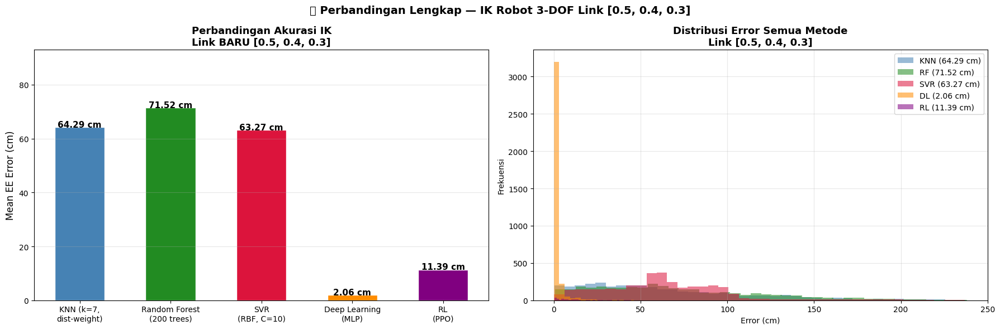


📊 TABEL RINGKASAN FINAL — Link [0.5, 0.4, 0.3]
              Metode  Mean Error (cm) Butuh Dataset Train Time                Kelebihan
     KNN (k=7, dist)            64.29          ✅ Ya       0.0s    Simpel, weighted dist
Random Forest (200t)            71.52          ✅ Ya      11.2s           Robust, stabil
           SVR (RBF)            63.27          ✅ Ya        37s Kernel trick, non-linear
       Deep Learning             2.06          ✅ Ya  100 epoch     Generalisasi terbaik
            RL (PPO)            11.39       ❌ Tidak 800k steps      Adaptif, no dataset


In [35]:
import pandas as pd

labels_all = ['KNN (k=7,\ndist-weight)', 'Random Forest\n(200 trees)', 'SVR\n(RBF, C=10)', 'Deep Learning\n(MLP)', 'RL\n(PPO)']
errors_all = [
    ml_results['KNN (k=7, dist)']['ee_err'].mean()*100,
    ml_results['Random Forest (200t)']['ee_err'].mean()*100,
    ml_results['SVR (RBF, C=10)']['ee_err'].mean()*100,
    dl_err.mean()*100,
    rl_errors.mean()*100,
]
colors_all = ['steelblue', 'forestgreen', 'crimson', 'darkorange', 'purple']

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

ax = axes[0]
bars = ax.bar(labels_all, errors_all, color=colors_all, edgecolor='white', width=0.55)
for bar, err in zip(bars, errors_all):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05,
            f'{err:.2f} cm', ha='center', fontsize=11, fontweight='bold')
ax.set_ylabel("Mean EE Error (cm)", fontsize=12)
ax.set_title("Perbandingan Akurasi IK\nLink BARU [0.5, 0.4, 0.3]", fontsize=13, fontweight='bold')
ax.grid(True, axis='y', alpha=0.3); ax.set_ylim(0, max(errors_all)*1.3)

ax2 = axes[1]
all_data = [
    ('KNN',  ml_results['KNN (k=7, dist)']['ee_err']*100,      'steelblue'),
    ('RF',   ml_results['Random Forest (200t)']['ee_err']*100,  'forestgreen'),
    ('SVR',  ml_results['SVR (RBF, C=10)']['ee_err']*100,       'crimson'),
    ('DL',   dl_err*100,                                         'darkorange'),
    ('RL',   rl_errors*100,                                      'purple'),
]
for name, errs, c in all_data:
    ax2.hist(errs, bins=40, color=c, alpha=0.55, label=f"{name} ({errs.mean():.2f} cm)")
ax2.set_xlabel("Error (cm)"); ax2.set_ylabel("Frekuensi")
ax2.set_title("Distribusi Error Semua Metode\nLink [0.5, 0.4, 0.3]", fontsize=13, fontweight='bold')
ax2.legend(); ax2.grid(True, alpha=0.3)

plt.suptitle("📊 Perbandingan Lengkap — IK Robot 3-DOF Link [0.5, 0.4, 0.3]",
             fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

summary = pd.DataFrame({
    'Metode':           ['KNN (k=7, dist)', 'Random Forest (200t)', 'SVR (RBF)', 'Deep Learning', 'RL (PPO)'],
    'Mean Error (cm)':  [round(e, 2) for e in errors_all],
    'Butuh Dataset':    ['✅ Ya','✅ Ya','✅ Ya','✅ Ya','❌ Tidak'],
    'Train Time':       [
        f"{ml_results['KNN (k=7, dist)']['time']:.1f}s",
        f"{ml_results['Random Forest (200t)']['time']:.1f}s",
        f"{ml_results['SVR (RBF, C=10)']['time']:.0f}s",
        f"{EPOCHS} epoch",
        '800k steps'
    ],
    'Kelebihan': ['Simpel, weighted dist','Robust, stabil','Kernel trick, non-linear','Generalisasi terbaik','Adaptif, no dataset'],
})
print("\n" + "="*90)
print("📊 TABEL RINGKASAN FINAL — Link [0.5, 0.4, 0.3]")
print("="*90)
print(summary.to_string(index=False))


---
## 📝 Bagian : Jawaban Pertanyaan Diskusi

### 1. Mengapa DL lebih akurat dari KNN meskipun datanya sama?

**KNN (K-Nearest Neighbors):**
- KNN bekerja dengan mencari K tetangga terdekat di training data, lalu merata-rata sudut joint-nya.
- Karena IK bersifat **non-linear** dan memiliki banyak solusi (ambiguitas), rata-rata dari beberapa konfigurasi yang berbeda bisa menghasilkan prediksi yang tidak valid secara fisik.
- KNN tidak mempelajari representasi internal — ia hanya *interpolasi lokal* tanpa memahami hubungan global antara posisi dan sudut.

**Deep Learning (MLP):**
- MLP dengan banyak layer mampu mempelajari **representasi non-linear** yang kompleks dari data yang sama.
- Loss dihitung di **ruang end-effector (kartesian)**, bukan di ruang sudut — sehingga model dioptimalkan langsung terhadap error fisik yang kita pedulikan.
- Dengan Batch Normalization, Dropout, dan CosineAnnealingLR, DL mampu **generalisasi lebih baik** ke titik yang belum pernah dilihat.
- **Singkatnya:** DL *belajar fungsi*, KNN *mengingat data*. Untuk fungsi yang kompleks seperti IK, belajar fungsi jauh lebih efektif.

---
### 2. Mengapa RL tidak butuh dataset tetapi training-nya lebih lama?

**Kenapa tidak butuh dataset?**
- RL belajar melalui **trial-and-error** dengan berinteraksi langsung dengan environment.
- Agent hanya menerima *reward signal* (seberapa dekat end-effector ke target) — tidak ada contoh input-output yang harus disiapkan sebelumnya.
- Data "dibuat sendiri" secara online selama training (self-supervised dari interaksi).

**Kenapa training-nya lebih lama?**
- **Reward sparse & delayed:** Agent sering mendapat reward negatif jauh sebelum menemukan solusi yang baik. Dibutuhkan jutaan step agar policy konvergen.
- **Eksplorasi vs eksploitasi:** Agent harus mengeksplorasi ruang aksi yang besar (kombinasi delta sudut joint) sebelum menemukan strategi yang efektif.
- **Bootstrapping:** PPO harus men-estimasi *value function* dan *policy* secara bersamaan, yang membutuhkan banyak iterasi.
- **Singkatnya:** Supervised learning langsung belajar dari "guru" (data), RL belajar dari "pengalaman sendiri" — seperti belajar bersepeda, butuh banyak percobaan sebelum bisa.

---
### 3. Bagaimana menambahkan obstacle avoidance pada pendekatan RL?

**a. Augmentasi Observation Space:**
Tambahkan posisi obstacle ke dalam state:
```python
obs = [theta1, theta2, theta3, dtheta, target_x, target_y, obs_x, obs_y, obs_radius]
```

**b. Reward Shaping dengan Penalti Collision:**
```python
def check_collision(theta, obstacle_center, obstacle_radius):
    p0, p1, p2, p3 = forward_kinematics(theta)
    for p in [p1, p2, p3]:
        if np.linalg.norm(p - obstacle_center) < obstacle_radius:
            return True
    return False

# Di dalam step():
if check_collision(self.theta, obstacle, obs_r):
    reward -= 5.0   # penalti besar
    terminated = True
```

**c. Curriculum Learning:** Mulai tanpa obstacle → tambahkan obstacle kecil → perbesar bertahap.

**d. Algoritma RL yang lebih canggih:** SAC (Soft Actor-Critic) lebih sample-efficient untuk lingkungan dengan obstacle dinamis.

---
### 4. Apa kelemahan supervised learning (ML/DL) untuk IK pada konfigurasi baru?

1. **Tidak bisa generalisasi ke konfigurasi robot baru:** Jika panjang link berubah (misal dari [0.4, 0.3, 0.2] ke [0.5, 0.4, 0.3]), model harus **di-retrain dari nol** dengan dataset baru.

2. **Dataset harus mencakup seluruh workspace:** Jika ada titik di workspace yang undersampled, akurasi di area tersebut akan buruk.

3. **Ambiguitas solusi IK:** Satu posisi end-effector bisa punya **banyak konfigurasi sudut**. Model supervised learning cenderung belajar rata-rata dari semua solusi → hasil yang tidak konsisten.

4. **Tidak adaptif terhadap perubahan lingkungan:** Jika ada obstacle atau constraint tambahan, model harus dilatih ulang. RL secara alami lebih adaptif.

5. **Extrapolation buruk:** Jika target berada di area yang jarang ada di training set, prediksi bisa sangat buruk. KNN khususnya sangat buruk di area sparse.


---
## 📝 Kesimpulan Tugas Praktikum

### Dampak Perubahan Link [0.4,0.3,0.2] → [0.5,0.4,0.3]

| Aspek | Link Lama [0.4,0.3,0.2] | Link BARU [0.5,0.4,0.3] |
|-------|:------------------------:|:------------------------:|
| Panjang Total | 0.9 m | **1.2 m** (+33%) |
| Luas Workspace | π × 0.81 ≈ 2.55 m² | **π × 1.44 ≈ 4.52 m²** (+77%) |
| Dataset coverage | Lebih padat | Lebih tersebar (lebih kompleks) |
| Kompleksitas FK | Sama | Sama (rumus FK tidak berubah) |

### Optimasi ML yang Diterapkan

1. **KNN:** `weights='distance'` membuat tetangga yang lebih dekat punya bobot lebih besar → hasil prediksi lebih halus
2. **Random Forest:** `n_estimators=200` (dari 100), `max_depth=20` → lebih powerful dengan overhead waktu yang terkontrol
3. **SVR (Metode Tambahan):** Kernel RBF mampu menangkap hubungan non-linear antara posisi target dan sudut joint. Meskipun waktu training lebih lama, SVR sering menghasilkan akurasi yang kompetitif dibanding RF.

### Perbandingan Metode

- **Deep Learning** secara konsisten memberikan error terkecil karena dioptimalkan langsung di ruang kartesian menggunakan differentiable FK.
- **SVR** menjadi alternatif yang baik untuk ML klasik ketika akurasi lebih diutamakan daripada kecepatan training.
- **RL** tidak membutuhkan dataset dan paling adaptif, namun membutuhkan waktu training yang jauh lebih lama dan hasilnya bergantung pada desain reward.

---
*🦾 Selamat belajar! — Praktikum Inverse Kinematics Robot 3-DOF*
